In [3]:
import os
%pwd

'c:\\Users\\hp\\Documents\\DS\\Complete Project\\04-Mobile-Price-Predictor\\research'

In [4]:
os.chdir("../")
%pwd

'c:\\Users\\hp\\Documents\\DS\\Complete Project\\04-Mobile-Price-Predictor'

<a class="anchor" id="About_Data"></a>
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">About Data</p> 

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

**Content:** 

The price of a cell phone, which has become a necessity in our daily lives, varies widely depending on its specifications. In this notebook, we will explore the factors that affect cell phone prices and predict new samples based on the best model.

    
**Objective:**   
    
Our objective is to predict the price range of a mobile phone by building a model that takes into account various features provided in the dataset. We will be using supervised learning methods such as **Decision Trees (DTs)**, **Random Forest**, and **Support Vector Machine (SVM)** to determine the best model for this problem.

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

|       | **Attribute** | **Information** |
| :---  |     :---      |       :---      |      
| **1** | battery_power | Total energy a battery can store in one time measured in (mAh) |                
| **2** | blue | Has bluetooth or not |                        
| **3** | clock_speed | Speed at which microprocessor executes instructions |
| **4** | dual_sim | Has dual sim support or not |
| **5** | fc | Front camera (Megapixels) |                     
| **6** | four_g | Has 4G or not |
| **7** | int_memory | Internal memory in (Gigabytes) |              
| **8** | m_dep | Mobile depth in (Cm)  |                      
| **9** | mobile_wt |  Weight of mobile phone |
| **10** | pc | Primary camera (Megapixels) |
| **11** | px_height | Pixel resolution height |                      
| **12** | px_width | Pixel resolution width |
| **13** | ram | Random access memory in (Megabytes)  |              
| **14** | sc_h | Screen height of mobile in (Cm)  |                      
| **15** | sc_w | Screen width of mobile in (Cm) |
| **16** | talk_time | Longest time that a single battery charge will last when you are constantly talking on the phone |
| **17** | three_g | Has 3G or not |                      
| **18** | touch_screen | Has touch screen or not | 
| **19** | wifi | Has wifi or not |              
| **20** | n_cores | Number of cores of processor |                       
| **21** | **price_range** | This is the Target variable with value of **0: (Low Cost**), **1: (Medium Cost**), **2: (High Cost**), and **3: (Very High Cost**) |

<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">1. Import Libraries</p>

In [39]:
# Data
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

#color pallet and theme
import matplotlib.colors

colors = ["#e9f5f0","#d5eae9","#2e5551",'#468e71','#4d9b68','#59ae8c']
colors2 = ["#2e5551",'#468e71','#4d9b68','#59ae8c', "#e9f5f0","#d5eae9"]
cmap = matplotlib.colors.ListedColormap(colors)

<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">2. Reading and Understanding the Dataset</p>

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">2.1. Import Dataset</p>

In [5]:
Data = pd.read_csv('artifacts/data_ingestion/Mobile-data-train.csv')

In [6]:
test = pd.read_csv('artifacts/data_ingestion/Mobile-data-test.csv')

In [7]:
# Preview the dataset (train)
Df = pd.DataFrame(Data)
Df.head(5)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [13]:
# Preview the dataset (test)
Df_test = pd.DataFrame(test)
Df_test.head(5)

,id,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,...,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1,1043,1,1.8,1,14,0,5,0.1,193,...,16,226,1412,3476,12,7,2,0,1,0
1,2,841,1,0.5,1,4,1,61,0.8,191,...,12,746,857,3895,6,0,7,1,0,0
2,3,1807,1,2.8,0,1,0,27,0.9,186,...,4,1270,1366,2396,17,10,10,0,1,1
3,4,1546,0,0.5,1,18,1,25,0.5,96,...,20,295,1752,3893,10,0,7,1,1,0
4,5,1434,0,1.4,0,11,1,49,0.5,108,...,18,749,810,1773,15,8,7,1,0,1


<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">2.2. Discover Data (train)</p>

In [8]:
# View dimensions of dataset   
rows, col = Df.shape
print ("Dimensions of dataset: {}" . format (Df.shape))
print ('Rows:', rows, '\nColumns:', col)

Dimensions of dataset: (2000, 21)
Rows: 2000 
Columns: 21


In [9]:
# Statistical details
Df.iloc[:, :-1].describe().T.sort_values(by='std', ascending = False)\
                          .style.background_gradient(cmap="Greens")\
                          .bar(subset=["max"], color='#F8766D')\
                          .bar(subset=["mean"], color='#00BFC4')

,count,mean,std,min,25%,50%,75%,max
ram,2000.000000,2124.213000,1084.732044,256.000000,1207.500000,2146.500000,3064.500000,3998.000000
px_height,2000.000000,645.108000,443.780811,0.000000,282.750000,564.000000,947.250000,1960.000000
battery_power,2000.000000,1238.518500,439.418206,501.000000,851.750000,1226.000000,1615.250000,1998.000000
px_width,2000.000000,1251.515500,432.199447,500.000000,874.750000,1247.000000,1633.000000,1998.000000
mobile_wt,2000.000000,140.249000,35.399655,80.000000,109.000000,141.000000,170.000000,200.000000
int_memory,2000.000000,32.046500,18.145715,2.000000,16.000000,32.000000,48.000000,64.000000
pc,2000.000000,9.916500,6.064315,0.000000,5.000000,10.000000,15.000000,20.000000
talk_time,2000.000000,11.011000,5.463955,2.000000,6.000000,11.000000,16.000000,20.000000
sc_w,2000.000000,5.767000,4.356398,0.000000,2.000000,5.000000,9.000000,18.000000
fc,2000.000000,4.309500,4.341444,0.000000,1.000000,3.000000,7.000000,19.000000


<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>The overhead table (train) displays:</strong> 
    <br>

- Each feature contains **2000** data recorded. 
- There are some numerical features in the dataset including **m_dep, px height, and sc_w** that their **min** values **don't make sense**.

In [10]:
# Number of uniqe elements in each columns
unique = Df.nunique()
unique.to_frame().T

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,1094,2,26,2,20,2,63,10,121,8,...,1137,1109,1562,15,19,19,2,2,2,4


In [11]:
# Information about the dataframe
Df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>The information of the train data shows:</strong> 
    <br>

- **clock_speed** and **m_dep** has an **float64** type and the rest of the features have an **int64** type.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">2.3. Discover Data (test)</p>

In [14]:
# View dimensions of dataset   
rows, col = Df_test.shape
print ("Dimensions of dataset: {}" . format (Df_test.shape))
print ('Rows:', rows,'\nColumns:', col)

Dimensions of dataset: (1000, 21)
Rows: 1000 
Columns: 21


In [15]:
# Statistical details
Df_test.iloc[:, :-1].describe().T.sort_values(by='std' , ascending = False)\
                     .style.background_gradient(cmap='Greens')\
                     .bar(subset=["max"], color='#F8766D')\
                     .bar(subset=["mean",], color='#00BFC4')

,count,mean,std,min,25%,50%,75%,max
ram,1000.000000,2138.998000,1088.092278,263.000000,1237.250000,2153.500000,3065.500000,3989.000000
px_width,1000.000000,1239.774000,439.670981,501.000000,831.750000,1250.000000,1637.750000,1998.000000
px_height,1000.000000,627.121000,432.929699,0.000000,263.750000,564.500000,903.000000,1907.000000
battery_power,1000.000000,1248.510000,432.458227,500.000000,895.000000,1246.500000,1629.250000,1999.000000
id,1000.000000,500.500000,288.819436,1.000000,250.750000,500.500000,750.250000,1000.000000
mobile_wt,1000.000000,139.511000,34.851550,80.000000,109.750000,139.000000,170.000000,200.000000
int_memory,1000.000000,33.652000,18.128694,2.000000,18.000000,34.500000,49.000000,64.000000
pc,1000.000000,10.054000,6.095099,0.000000,5.000000,10.000000,16.000000,20.000000
talk_time,1000.000000,11.085000,5.497636,2.000000,6.750000,11.000000,16.000000,20.000000
fc,1000.000000,4.593000,4.463325,0.000000,1.000000,3.000000,7.000000,19.000000


<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>The overhead table (test) displays:</strong> 
    <br>

- Each feature contains **1000** data recorded. 
- There are some numerical features in the dataset including **m_dep, px height, and sc_w** that their **min** values **don't make sense**.

In [16]:
# Information about the dataframe
Df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             1000 non-null   int64  
 1   battery_power  1000 non-null   int64  
 2   blue           1000 non-null   int64  
 3   clock_speed    1000 non-null   float64
 4   dual_sim       1000 non-null   int64  
 5   fc             1000 non-null   int64  
 6   four_g         1000 non-null   int64  
 7   int_memory     1000 non-null   int64  
 8   m_dep          1000 non-null   float64
 9   mobile_wt      1000 non-null   int64  
 10  n_cores        1000 non-null   int64  
 11  pc             1000 non-null   int64  
 12  px_height      1000 non-null   int64  
 13  px_width       1000 non-null   int64  
 14  ram            1000 non-null   int64  
 15  sc_h           1000 non-null   int64  
 16  sc_w           1000 non-null   int64  
 17  talk_time      1000 non-null   int64  
 18  three_g  

<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">3. Preprocessing</p>

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

🔍Because some numeric features in the dataset, including **m_dep, px height, and sc_w**, whose minimum values did not make sense, should be investigated more deeply.

#### 🎄Mobile Depth (Cm):

In [17]:
Df.m_dep.describe()

count    2000.000000
mean        0.501750
std         0.288416
min         0.100000
25%         0.200000
50%         0.500000
75%         0.800000
max         1.000000
Name: m_dep, dtype: float64

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

- ✅According to the text as well as the reference below, I will consider the **minimum Mobile Depth** to be **0.5 centimeters**.

The minimum range of mobile phone depth varies depending on the manufacturer, model, and specific phone design. However, most smartphones have a thickness (depth) in the range of **7mm to 10mm**. Some high-end models may be thinner than this range, with depths as low as **6mm or even less**.

🔍[Reference](https://www.techrankup.com/en/smartphones-thickness-ranking/)

#### 🎄Pixel Resolution (Height):

In [18]:
Df.px_height.describe()

count    2000.000000
mean      645.108000
std       443.780811
min         0.000000
25%       282.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

- ✅I considered the dimensions of the **Nokia 1100 (96 x 65 pixels, 3:2 ratio)** as the **minimum of Pixel Resolution**.➡️ **65 pixels**

🔍[Reference](https://www.gsmarena.com/nokia_1100-512.php)

#### 🎄Screen Width (Cm):

In [19]:
Df.sc_w.describe()

count    2000.000000
mean        5.767000
std         4.356398
min         0.000000
25%         2.000000
50%         5.000000
75%         9.000000
max        18.000000
Name: sc_w, dtype: float64

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

- ✅According to the **Nokia 1100 screen resolution (96 x 65 pixels, 3:2 ratio)**, I will consider the **minimum Screen Width** to be **1 inch = 2.54 centimeters**.

🔍[Reference](https://www.gsmarena.com/nokia_1100-512.php)

<a id="1"></a>  
# <p style="padding:10px;background-color:#2e5551;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">4. Data Cleaning</p>

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    
Let's first address what we discussed in the data preprocessing section.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Mobile Depth</p>

#### 🎄Train Data

In [20]:
# Find values below 0.5 cm
below_threshold = Df["m_dep"][Df["m_dep"] < 0.5]

# Count the number of values below 0.5 cm
num_below_threshold = len(below_threshold)

# Print the number of values below 0.5 cm
print("Number of values below 0.5 cm in 'm_dep' feature: ", num_below_threshold)

Number of values below 0.5 cm in 'm_dep' feature:  900


In [21]:
# Replace values below 0.5 cm with 0.5 cm
Df["m_dep"][Df["m_dep"] < 0.5] = 0.5

In [22]:
Df.m_dep.describe()

count    2000.000000
mean        0.626000
std         0.165159
min         0.500000
25%         0.500000
50%         0.500000
75%         0.800000
max         1.000000
Name: m_dep, dtype: float64

#### 🎄Test Data

In [23]:
# Find values below 0.5 cm
below_threshold3 = Df_test["m_dep"][Df_test["m_dep"] < 0.5]

# Count the number of values below 0.5 cm
num_below_threshold3 = len(below_threshold3)

# Print the number of values below 0.5 cm
print("Number of values below 0.5 cm in 'm_dep' feature: ", num_below_threshold3)

Number of values below 0.5 cm in 'm_dep' feature:  418


In [24]:
# Replace values below 0.5 cm with 0.5 cm
Df_test["m_dep"][Df_test["m_dep"] < 0.5] = 0.5

In [25]:
Df_test.m_dep.describe()

count    1000.00000
mean        0.62880
std         0.16516
min         0.50000
25%         0.50000
50%         0.50000
75%         0.80000
max         1.00000
Name: m_dep, dtype: float64

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Pixel Resolution</p>

#### 🎄Train Data

In [26]:
# Find values below 65 pixels
below_threshold1 = Df["px_height"][Df["px_height"] < 65]

# Count the number of values below 65 pixels
num_below_threshold1 = len(below_threshold1)

# Print the number of values below 65 pixels
print("Number of values below 65 pixels in 'px_height' feature: ", num_below_threshold1)

Number of values below 65 pixels in 'px_height' feature:  90


In [27]:
# Replace values below 65 pixels with 65 pixels
Df["px_height"][Df["px_height"] < 65] = 65

In [28]:
Df.px_height.describe()

count    2000.000000
mean      646.529000
std       441.845917
min        65.000000
25%       282.750000
50%       564.000000
75%       947.250000
max      1960.000000
Name: px_height, dtype: float64

#### 🎄Test Data

In [29]:
# Find values below 65 pixels
below_threshold4 = Df_test["px_height"][Df_test["px_height"] < 65]

# Count the number of values below 65 pixels
num_below_threshold4 = len(below_threshold4)

# Print the number of values below 65 pixels
print("Number of values below 65 pixels in 'px_height' feature: ", num_below_threshold4)

Number of values below 65 pixels in 'px_height' feature:  62


In [30]:
# Replace values below 65 pixels with 65 pixels
Df_test["px_height"][Df_test["px_height"] < 65] = 65

In [31]:
Df_test.px_height.describe()

count    1000.000000
mean      629.296000
std       429.975194
min        65.000000
25%       263.750000
50%       564.500000
75%       903.000000
max      1907.000000
Name: px_height, dtype: float64

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Screen Width</p>

#### 🎄Train Data

In [32]:
# Find values below 2.54 cm
below_threshold2 = Df["sc_w"][Df["sc_w"] < 2.54]

# Count the number of values below 2.54 cm
num_below_threshold2 = len(below_threshold2)

# Print the number of values below 2.54 cm
print("Number of values below 2.54 cm in 'sc_w' feature: ", num_below_threshold2)

Number of values below 2.54 cm in 'sc_w' feature:  546


In [33]:
# Replace values below 2.54 cm with 2.54 cm
Df["sc_w"][Df["sc_w"] < 2.54] = 2.54

In [34]:
Df.sc_w.describe()

count    2000.000000
mean        6.199420
std         3.891793
min         2.540000
25%         2.540000
50%         5.000000
75%         9.000000
max        18.000000
Name: sc_w, dtype: float64

#### 🎄Test Data

In [35]:
# Find values below 2.54 cm
below_threshold5 = Df_test["sc_w"][Df_test["sc_w"] < 2.54]

# Count the number of values below 2.54 cm
num_below_threshold5 = len(below_threshold5)

# Print the number of values below 2.54 cm
print("Number of values below 2.54 cm in 'sc_w' feature: ", num_below_threshold5)

Number of values below 2.54 cm in 'sc_w' feature:  318


In [36]:
# Replace values below 2.54 cm with 2.54 cm
Df_test["sc_w"][Df_test["sc_w"] < 2.54] = 2.54

In [37]:
Df_test.sc_w.describe()

count    1000.000000
mean        5.810720
std         3.740874
min         2.540000
25%         2.540000
50%         5.000000
75%         8.000000
max        18.000000
Name: sc_w, dtype: float64

✅ Done

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Missing Values</p>

### 🟢Check for Missing Values

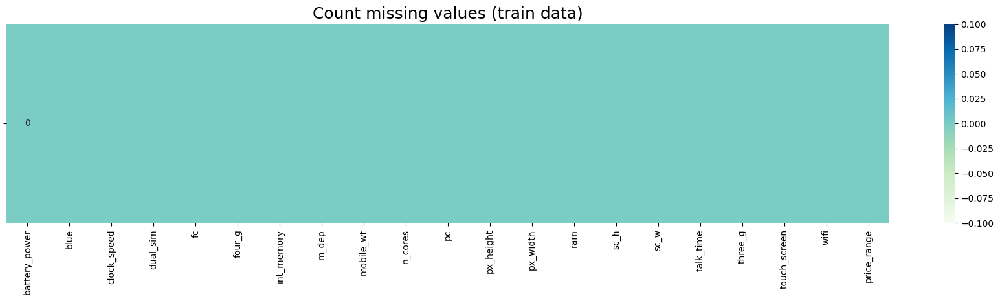

In [47]:
# Missing values (train)
plt.figure(figsize=(22, 4))
x = (Df.isnull().sum()).to_frame(name='').T.astype(int)
sns.heatmap(x, cmap='GnBu', annot=True, fmt='0.0f')
plt.title('Count missing values (train data)', fontsize=18)
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

There aren't any **missing values** in the **train** dataset.

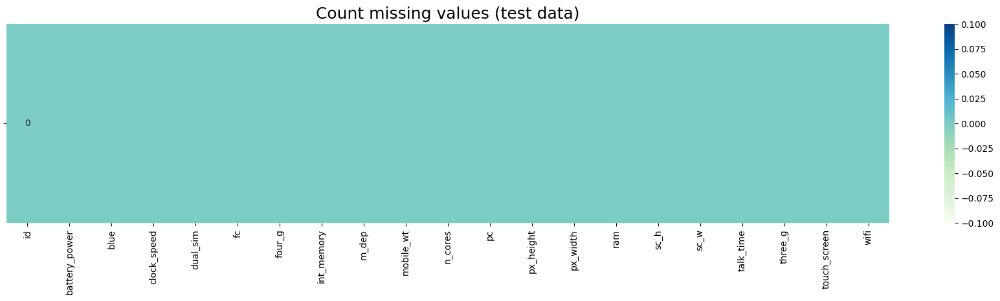

In [48]:
# Missing values (test)
plt.figure(figsize=(22,4))
sns.heatmap((Df_test.isna().sum()).to_frame(name='').T,cmap='GnBu', annot=True,
             fmt='0.0f').set_title('Count missing values (test data)', fontsize=18)
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
There aren't any missing values in the test dataset.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Duplicated Data</p>

### 🟢Check for Duplicated data

In [49]:
# Duplicated data (train)
Df.duplicated().sum()

0

In [50]:
# Duplicated data (test)
Df_test.duplicated().sum()

0

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Redundant Columns</p>

### 🟢Drop Redundant Columns

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

We should drop any **redundant columns** from the dataset which does not have any predictive power. Here, **'Id'** is the redundant column in test data. So, we will drop it first.

In [51]:
# Drop Id column in test data
Df_test.drop(['id'], axis=1, inplace=True)
Df_test.shape

(1000, 20)

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Outliers</p>

### 🟢Check for Outliers

In [52]:
# Separate numerical and categorical features
num_cols = pd.DataFrame (Df, columns= ['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time'])
cat_cols = pd.DataFrame (Df, columns= ['blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi'])

In [53]:
# Separate numerical and categorical features into different lists
numerical_columns = list(Df.loc[:,['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep', 'mobile_wt', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time']])
categorical_columns = list(Df.loc[:,['blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi']])

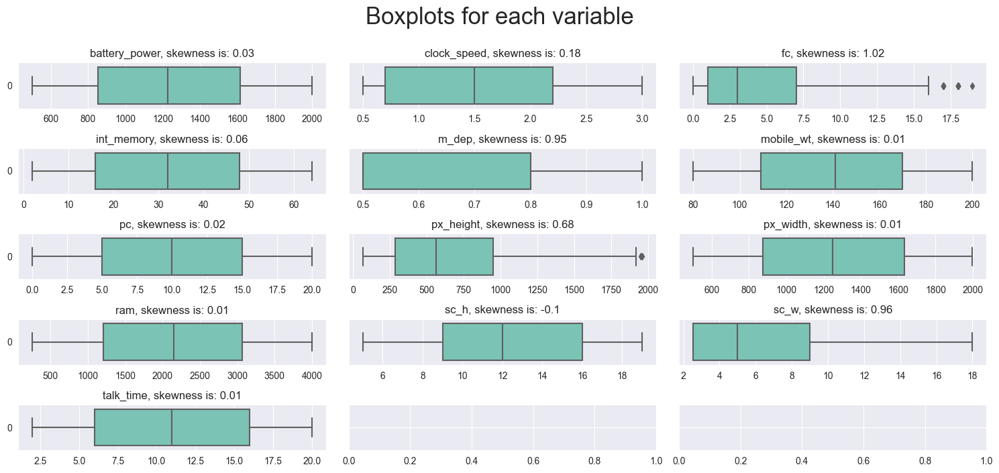

In [54]:
# Visualizing the Numerical Features by boxplots
sns.set_style('darkgrid')
def boxplots_custom(dataset, columns_list, rows, cols, suptitle):
    fig, axs = plt.subplots(rows, cols, sharey=True, figsize=(15,7))
    fig.suptitle(suptitle, y=1, size=25)
    axs = axs.flatten()
    for i, data in enumerate(columns_list):
        sns.boxplot(data=dataset[data], orient='h', color ='#6fcfbc', ax=axs[i])
        axs[i].set_title(data + ', skewness is: '+str(round(dataset[data].skew(axis = 0, skipna = True), 2)))
        
boxplots_custom(dataset=Df, columns_list=num_cols, rows=5, cols=3, suptitle='Boxplots for each variable')
plt.tight_layout()

### 🟢Detect Outliers

In [55]:
# Calculate the IQR for each column in the dataset
Q1 = num_cols.quantile(0.25)
Q3 = num_cols.quantile(0.75)
IQR = Q3 - Q1

# Identify outliers using the IQR method
outliers = ((num_cols < (Q1 - 1.5 * IQR)) | (num_cols > (Q3 + 1.5 * IQR)))

# Count the number of outliers for each variable
num_outliers = outliers.sum()

# Number of outliers for each variable
num_outliers.to_frame().T

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
0,0,0,18,0,0,0,0,2,0,0,0,0,0


<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

- While the boxplots in the table above indicate the presence of outliers in the **fc** and **px_height** features, we cannot justify removing them from the dataset without a strong rationale to do so. Therefore, we have decided to retain these outliers in our analysis.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">🎄Noises</p>

### 🟢Check for Noises

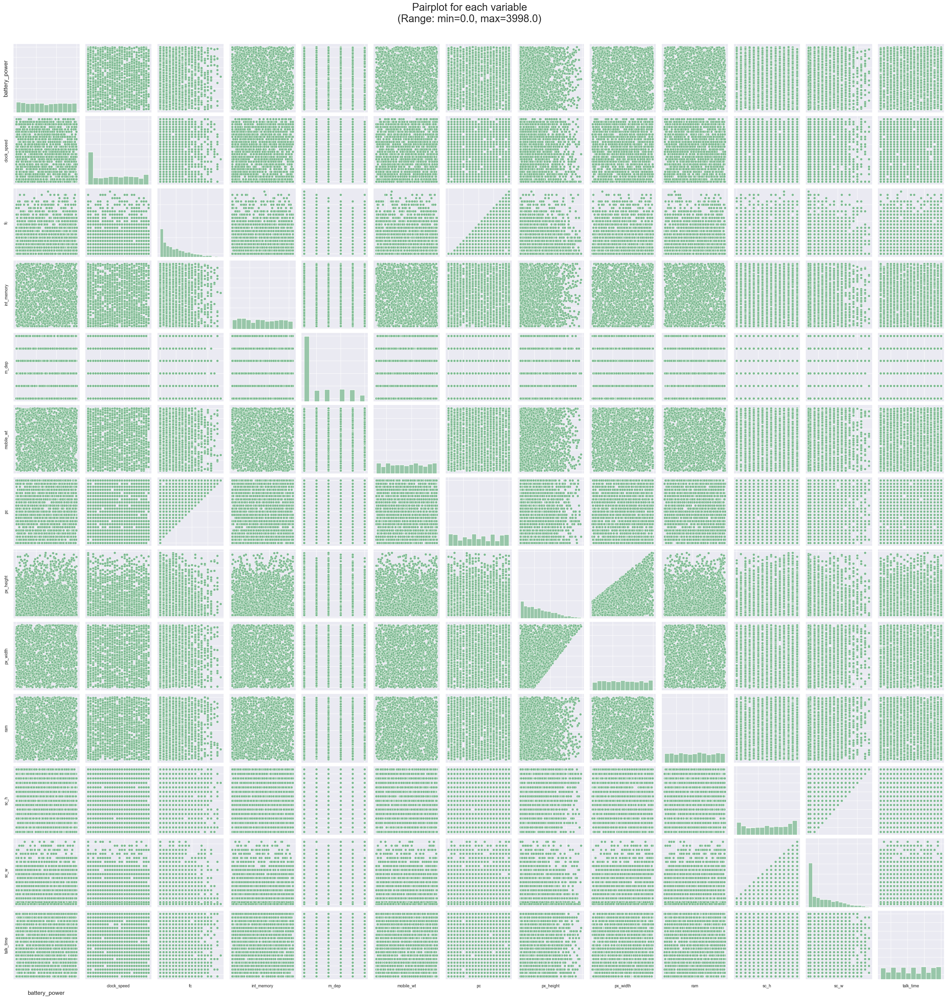

In [56]:
# Check noises by pairplot
sns.set_palette('crest')
sns.set_style('darkgrid')
dnp = sns.pairplot(Df.loc[:, numerical_columns])

# Add axis labels and tick labels to the plot
dnp.set(xticklabels=[], yticklabels=[])
dnp.axes[0][0].set_ylabel(numerical_columns[0], fontsize=14)
dnp.axes[-1][0].set_xlabel(numerical_columns[0], fontsize=14)
dnp.axes[-1][0].xaxis.labelpad = 20
dnp.axes[-1][-1].yaxis.labelpad = 20

# Title of the plot
dnp.fig.suptitle('Pairplot for each variable\n(Range: min={}, max={})'.format(Df[numerical_columns].min().min(), Df[numerical_columns].max().max()), y=1.03, fontsize=25)

# Show the plot
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
- It seems that there isn't any **Noisy** data in the train dataset.

<a id="1"></a>  
# <p style="padding:10px;background-color:#254441;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">5. Exploratory Data Analysis (EDA)</p>

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">5.1. Continuos and Categorical Data Distribution</p>

Total number of features except for the target: 20
Number of categorical (<25 Unique Values) features: 13
Number of continuous features: 7


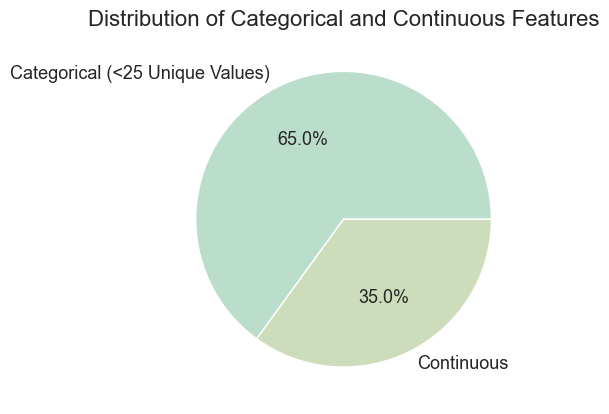

In [57]:
TARGET = 'price_range'
FEATURES = [col for col in Df.columns if col not in ['Df', TARGET]]

cat_features = [col for col in FEATURES if Df[col].nunique() < 25]
cont_features = [col for col in FEATURES if Df[col].nunique() >= 25]

num_cat_features = len(cat_features)
num_cont_features = len(cont_features)

print(f"Total number of features except for the target: {len(FEATURES)}")
print(f"\033[92mNumber of categorical (<25 Unique Values) features: {num_cat_features}")
print(f"\033[96mNumber of continuous features: {num_cont_features}")

# Define labels and colors for the pie chart
labels = ['Categorical (<25 Unique Values)', 'Continuous']
colors = ['#bbddcb', '#cdddbb']

plt.pie([num_cat_features, num_cont_features], 
        labels=labels,
        colors=colors,
        textprops={'fontsize': 13},
        autopct='%1.1f%%')

# Add a title to the plot
plt.title('Distribution of Categorical and Continuous Features', fontsize=16)

# Show the plot
plt.show()

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">5.2. Data Imbalance</p>

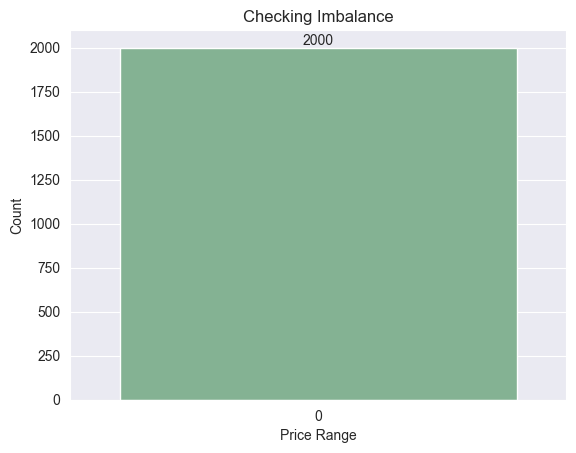

In [58]:
# Create a count plot of the 'price_range' column and label the bars with their counts
ax = sns.countplot(Df["price_range"])
for container in ax.containers:
    ax.bar_label(container)

# Set the x-axis and y-axis labels
plt.xlabel("Price Range")
plt.ylabel("Count")

# Set the title of the plot
plt.title("Checking Imbalance")

# Show the plot
plt.show()

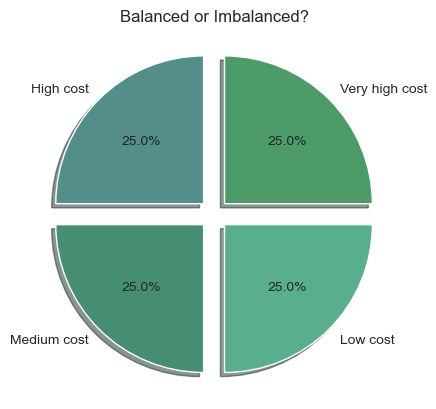

In [50]:
# Count the number of occurrences of each value in the 'price_range' column
value_counts = pd.value_counts(Df['price_range'])

# Define the label strings using f-strings
label = [f'{"Very high" if i==0 else "High" if i==1 else "Medium" if i==2 else "Low"} cost' for i in range(len(value_counts))]

# Define the colors for each pie slice
colors = ['#4d9b68', '#538e8a', '#468e71', '#59ae8c']

# Create a pie chart with percentage values formatted with a % sign and explode the slices
fig, ax = plt.subplots()
ax.pie(value_counts.values, autopct='%0.1f%%', explode=[0.1, 0.1, 0.1, 0.1], shadow=True, labels=label, colors=colors)

# Set the title of the pie chart
ax.set_title('Balanced or Imbalanced?')

# Show the pie chart
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

- The above charts show that all classes of the target variable have the **same count**. So, the target data is **completely balanced**.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">5.3. Univariate Analysis</p>

<h4 align="left"><font color='#254441'>5.3.1. Exploring Categorical Features</font>

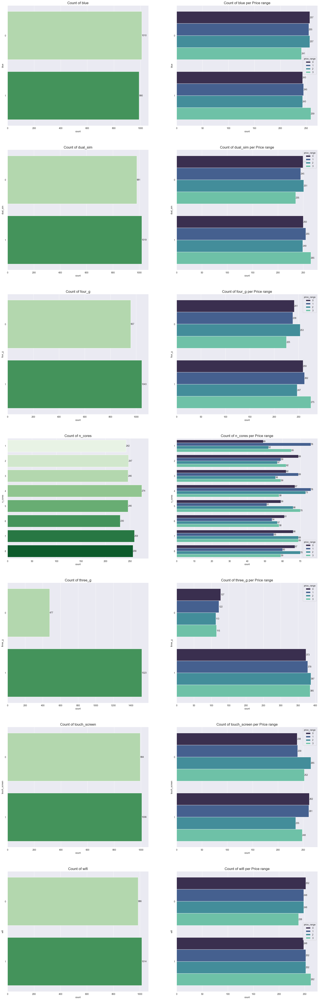

In [59]:
fig, axes = plt.subplots(7,2, figsize=(25,80))
sns.set_style('darkgrid')
idx = 0
for col in categorical_columns:
    sns.countplot(data=Df, y=col, palette='Greens', orient='h',
                  ax=axes[idx][0]).set_title(f'Count of {col}', fontsize='16')
    for container in axes[idx][0].containers:
        axes[idx][0].bar_label(container)
    sns.countplot(data=Df, y=col, palette='mako', orient='h',  hue='price_range',
                  ax=axes[idx][1]).set_title(f'Count of {col} per Price range', fontsize='16')
    for container in axes[idx][1].containers:
        axes[idx][1].bar_label(container)
    idx +=1
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>
    
- **Bluetooth:**    
  - The count of the **blue** chart shows that mobile phones **without Bluetooth** have the highest frequency than the ones with Bluetooth.
  - Moreover, the count of **blue** per price range shows that in the group of mobile phones **without Bluetooth**, the **Low-cost** and **High-cost** phones have the highest frequency, and on the other hand, in the group of mobile phones **with Bluetooth**, the **Very high-cost** phones have the highest frequency.
    
- **Dual Sim:**     
  - The count of the **dual_sim** chart shows that mobile phones which **have Dual Sim** have the highest frequency.
  - Moreover, the count of **dual_sim** per price range shows that in the group of mobile phones **without Dual Sim**, the **High-cost** and **Low-cost** phones have the highest frequency, and in the group of mobile phones **with Dual Sim**, the **Very high-cost** phones have the highest frequency.
    
- **4G:**     
  - The count of the **four_g** chart shows that mobile phones which **have 4G** have the highest frequency than the ones without 4G.
  - Moreover, the count of **four_g** per price range shows that in the group of mobile phones **with 4G**, the **Medium-cost** phones have the highest frequency.    
    
- **Number of Cores:**     
  - The count of the **n-cores** chart shows that mobile phones **containing 4 cores** have the highest frequency.
  - Moreover, the count of **n-cores** per price range shows that in the group of mobile phones **with 4 cores**, the **High-cost** phones have the highest frequency, and in the group of mobile phones **containing 4 cores**, the **Medium-cost** phones have the highest frequency.  
    
- **3G:**     
  - The count of the **three_g** chart shows that mobile phones **with 3G** have the highest frequency than the ones without 3G.
  - Moreover, the count of **three_g** per price range shows that in the group of mobile phones **with 3G**, the **High-cost** phones have the highest frequency, and in the group of mobile phones **without 3G**, the **Low-cost** phones have the highest frequency.
    
- **Touch Screen:**     
  - The count of the **touch_screen** chart shows that mobile phones which **have Touch Screen** have the highest frequency than the ones without Touch Screen.
  - Moreover, the count of **touch_screen** per price range shows that in the group of mobile phones **with Touch Screen**, the **Low-cost** phones have the highest frequency, and in the group of mobile phones **without Touch Screen**, the **High-cost** phones have the highest frequency.
    
- **Wifi:**     
  - The count of the **wifi** chart shows that mobile phones which **have Wifi** have the highest frequency than the ones without Wifi.
  - Moreover, the count of **wifi** per price range shows that in the group of mobile phones **with Wifi**, the **Very high-cost** phones have the highest frequency, and in the group of mobile phones **without Wifi**, the **Low-cost** phones have the highest frequency.

In [60]:
from IPython.core.display import HTML

def multi_table(table_list):
    ''' Acceps a list of IpyTable objects and returns a table which contains each IpyTable in a cell
    '''
    return HTML(
        '<table><tr style="background-color:white;">' + 
        ''.join(['<td>' + table._repr_html_() + '</td>' for table in table_list]) +
        '</tr></table>')

In [61]:
print("An overview of percentages of each unique value in different categorical features:")
Df_nunique = {var: pd.DataFrame((Df[var].value_counts()/len(Df[var])*100).map('{:.2f}%'.format)) 
              for var in {'blue', 'dual_sim', 'four_g', 'n_cores', 'three_g', 'touch_screen', 'wifi'}}
multi_table([Df_nunique['blue'], Df_nunique['dual_sim'],Df_nunique['four_g'],Df_nunique['n_cores'],Df_nunique['three_g'],Df_nunique['touch_screen'],Df_nunique['wifi']])

An overview of percentages of each unique value in different categorical features:


,count
blue,
0,50.50%
1,49.50%
,count
dual_sim,
1,50.95%
0,49.05%
,count
four_g,
1,52.15%


In [62]:
# Describing the categorical variables
cat_cols.describe().style.background_gradient(cmap=cmap)

,blue,dual_sim,four_g,n_cores,three_g,touch_screen,wifi
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,0.495000,0.509500,0.521500,4.520500,0.761500,0.503000,0.507000
std,0.500100,0.500035,0.499662,2.287837,0.426273,0.500116,0.500076
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,3.000000,1.000000,0.000000,0.000000
50%,0.000000,1.000000,1.000000,4.000000,1.000000,1.000000,1.000000
75%,1.000000,1.000000,1.000000,7.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,8.000000,1.000000,1.000000,1.000000


<h4 align="left"><font color='#254441'>5.3.2. Exploring Numerical Features</font>

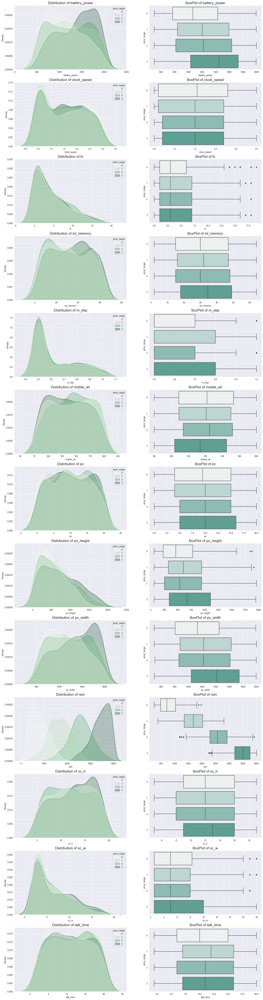

In [63]:
fig, axes = plt.subplots(13,2, figsize=(20,80))
sns.set_style('darkgrid')
idx = 0
for col in (numerical_columns):
    sns.kdeplot(data=Df, x=col, palette='Greens',fill=True , hue='price_range', 
                ax=axes[idx][0]).set_title(f'Distribution of {col}', fontsize='16')
    sns.boxplot(data=Df, x=col, palette='light:#5A9' , y='price_range', orient='h', 
                ax=axes[idx][1]).set_title(f'BoxPlot of {col}', fontsize='16')
    idx +=1
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>
    
- A **normal distribution (with no skewness)** is observed in the features of **int_memory**, **mobile_wt**, **pc** and **talk time** for all price ranges.
    
- **Battery Power**:    
  - Mobile phones with price ranges of 0-3 mostly have **battery_power** at the range of **600-800, 700-1350, 600-900**, and **1500-1900 mAh**, respectively.
    
- **Clock Speed**: 
  - Mobile phones with all price ranges mostly have **clock_speed** at the range of **0.4-0.8**.
  - A **positive skewness** is observed in the distribution of **clock_speed** for all price ranges.
  - The box plot of **clock_speed** indicates that all price ranges have the same **median** equal **1.5**.
    
- **Front Camera**:
  - Mobile phones with all price ranges mostly have **fc** in the range of **0-2.5 megapixels**.
  - A **positive skewness** is observed in the distribution of **fc** for all price ranges.
  - The box plot of **fc** indicates that all price ranges have the same **median** equal **3 megapixels**.
    
- **Internal Memory**:    
  - Mobile phones with price ranges of 0-3 mostly have **int_memory** at the range of **10-30, 35-50, 13-20**, and **40-50 gigabytes**, respectively.
 
- **Mobile Depth**: 
  - A **positive skewness** is observed in the distribution of **m_dep** for all price ranges.
  - Mobile phones with all price ranges mostly have **m_dep** at the range of **0.5-0.55 cm**.
    
- **Pixel Resolution Height**:     
  - A **positive skewness** is observed in the distribution of **px_height** for all price ranges.
  - Mobile phones with all price ranges mostly have **px_height** in the range of **65-500 pixels**.
    
- **Pixel Resolution Width**:
  - Mobile phones with price ranges of 0-3 mostly have **px_width** in the range of **750-900, 700-1350, 750-1200**, and **1500-1700 pixels**, respectively.
    
- **Ram**:
  - Mobile phones with price ranges of 0-3 mostly have **ram** at the range of **450-750, 1350-1900, 2500-2800**, and **3500-3950 megabytes**, respectively.
    
- **Screen Width**:
  - A **positive skewness** is observed in the distribution of **sc_w** for all price ranges.
  - Mobile phones with all price ranges mostly have **sc_w** in the range of **2.5-4 cm**.
  - The box plot of **sc_w** indicates that all price ranges have the same **median** equal **1.5 cm**.

In [64]:
pr = Df.groupby(['price_range'])
target = pr.describe(percentiles = [0.25, 0.5, 0.75])[numerical_columns]
target.T.style.background_gradient(cmap='Greens')

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
   <strong>Observations:</strong> 
    <br>
    
- The highest **mean** value of **battery_power**, **int_memory**, **pc**, **px_height**, **px_width**, **ram**, **sc_h** and **sc_w** belong to the **Very high-cost** mobile phones.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">5.4. Bivariate Analysis</p>

#### 🎄Clock speed:

In [65]:
Df.clock_speed.describe()

count    2000.000000
mean        1.522250
std         0.816004
min         0.500000
25%         0.700000
50%         1.500000
75%         2.200000
max         3.000000
Name: clock_speed, dtype: float64

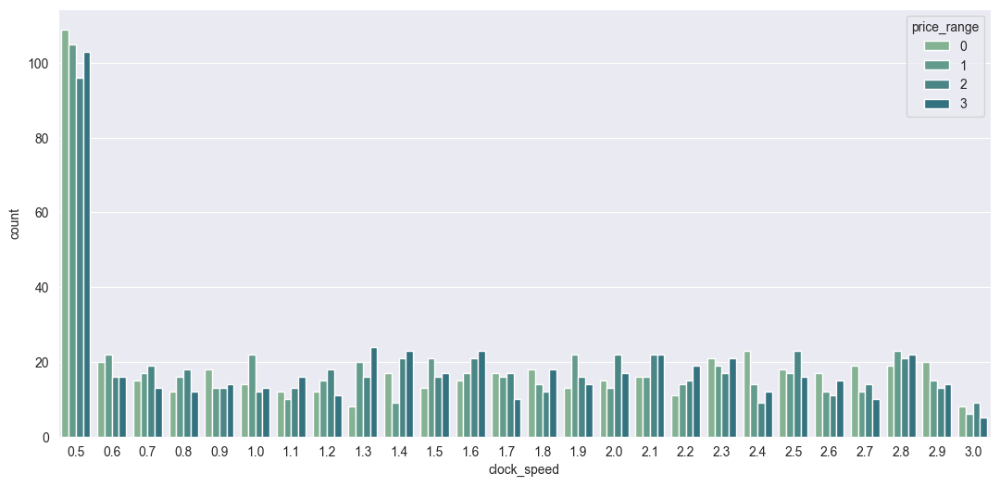

In [66]:
# clock_speed based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['clock_speed'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>

- The above chart illustrates that the phones with a **clock_speed** of **0.5** contains the highest count among all mobile phones.

#### 🎄Front Camera (Megapixels):

In [67]:
Df.fc.describe()

count    2000.000000
mean        4.309500
std         4.341444
min         0.000000
25%         1.000000
50%         3.000000
75%         7.000000
max        19.000000
Name: fc, dtype: float64

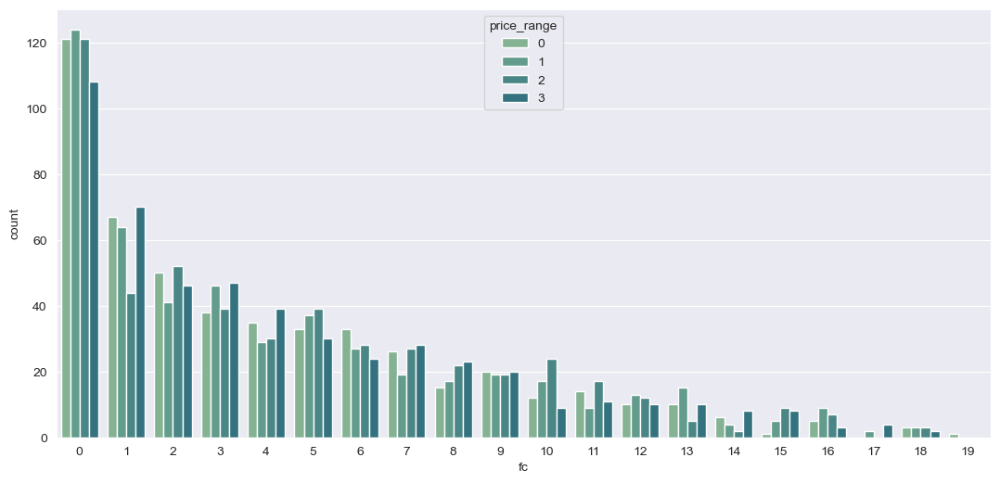

In [60]:
# fc based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['fc'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
        <strong>Observations:</strong> 
    <br>

- The above chart illustrates that with the increase in the value of **fc** from 0-19, their count will decrease. This indicates that as the **front camera** becomes more powerful, the number of phones decreases.

#### 🎄Internal Memory (Gigabytes):

In [68]:
Df.int_memory.describe()

count    2000.000000
mean       32.046500
std        18.145715
min         2.000000
25%        16.000000
50%        32.000000
75%        48.000000
max        64.000000
Name: int_memory, dtype: float64

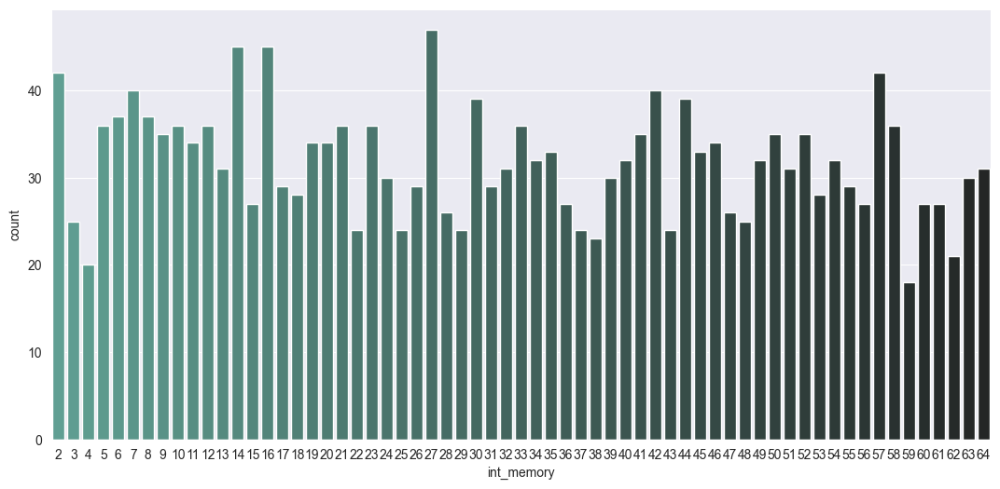

In [69]:
# count of int_memory
plt.figure(figsize = (13,6))
sns.countplot(x = Df['int_memory'], palette='dark:#5A9_r', data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>
    
- Mobile phones with **27 gigabytes** of **int_memory** with the value of **64** have the highest count among all phones.

#### 🎄Mobile Depth (Cm):

In [70]:
Df.m_dep.describe()

count    2000.000000
mean        0.626000
std         0.165159
min         0.500000
25%         0.500000
50%         0.500000
75%         0.800000
max         1.000000
Name: m_dep, dtype: float64

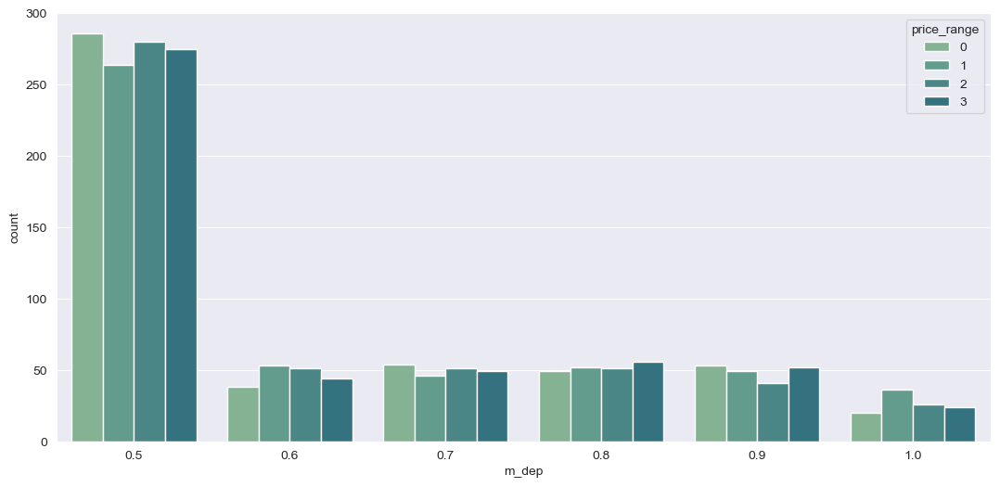

In [64]:
# m_dep based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['m_dep'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
        <strong>Observations:</strong> 
    <br>
    
- Mobile phones with **0.5 cm** of **m_dep** have the highest count among all phones.

#### 🎄Primary Camera (Megapixels):

In [71]:
Df.pc.describe()

count    2000.000000
mean        9.916500
std         6.064315
min         0.000000
25%         5.000000
50%        10.000000
75%        15.000000
max        20.000000
Name: pc, dtype: float64

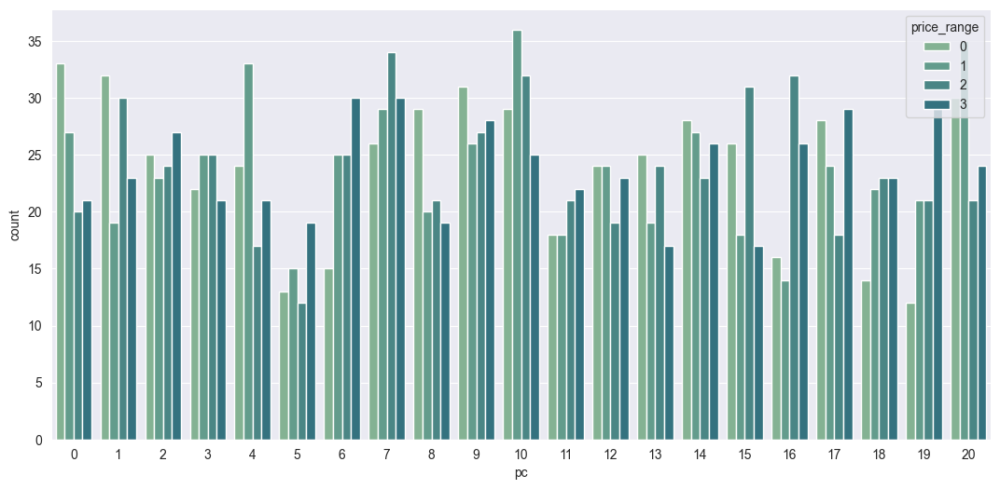

In [72]:
# pc based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['pc'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
        <strong>Observations:</strong> 
    <br>

- In general, mobile phones with **5 Megapixels** of **pc** have the lowest count among all phones.

#### 🎄Screen Height (Cm):

In [73]:
Df.sc_h.describe()

count    2000.000000
mean       12.306500
std         4.213245
min         5.000000
25%         9.000000
50%        12.000000
75%        16.000000
max        19.000000
Name: sc_h, dtype: float64

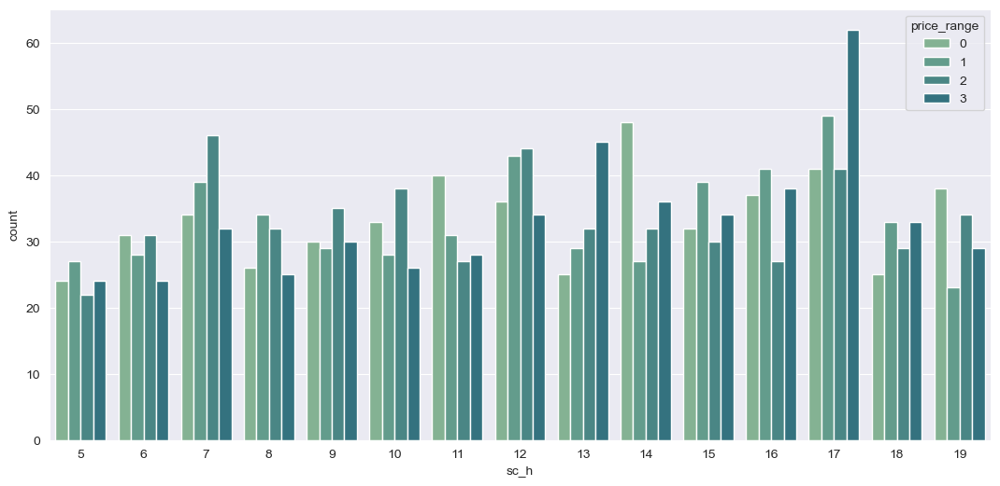

In [68]:
# sc_h based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['sc_h'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
        <strong>Observations:</strong> 
    <br>
    
- In general, mobile phones with **17 Cm** of **sc_h** have the highest count among all phones.

#### 🎄Screen Width (Cm):

In [74]:
Df.sc_w.describe()

count    2000.000000
mean        6.199420
std         3.891793
min         2.540000
25%         2.540000
50%         5.000000
75%         9.000000
max        18.000000
Name: sc_w, dtype: float64

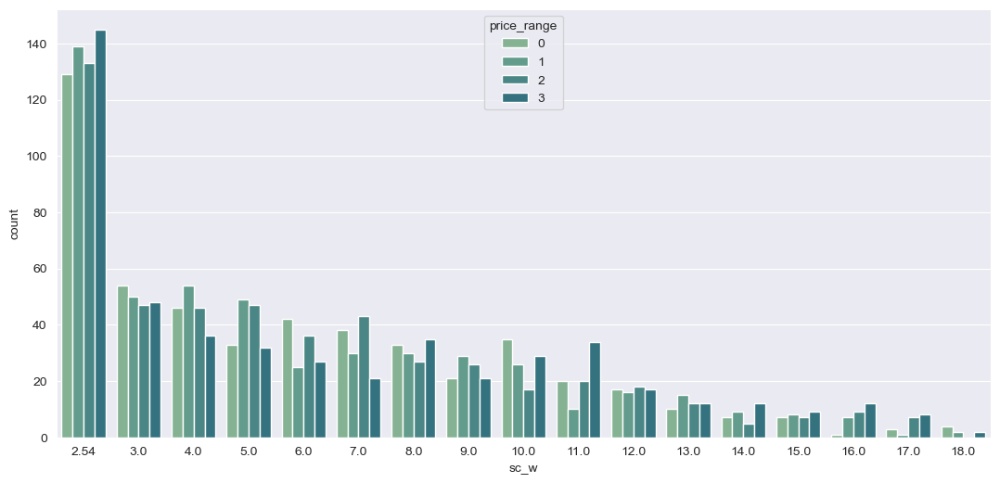

In [70]:
# sc_w based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['sc_w'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>

- The above chart demonstrates that with the increase in the value of **sc_w** from **2.54-18**, their count will decrease. This indicates that as the **Screen Width** becomes bigger, the number of phones decreases.
- In general, mobile phones with **2.54 cm or 1-inch** of **sc_w** have the highest count among all phones.

#### 🎄Talk Time:

In [75]:
Df.talk_time.describe()

count    2000.000000
mean       11.011000
std         5.463955
min         2.000000
25%         6.000000
50%        11.000000
75%        16.000000
max        20.000000
Name: talk_time, dtype: float64

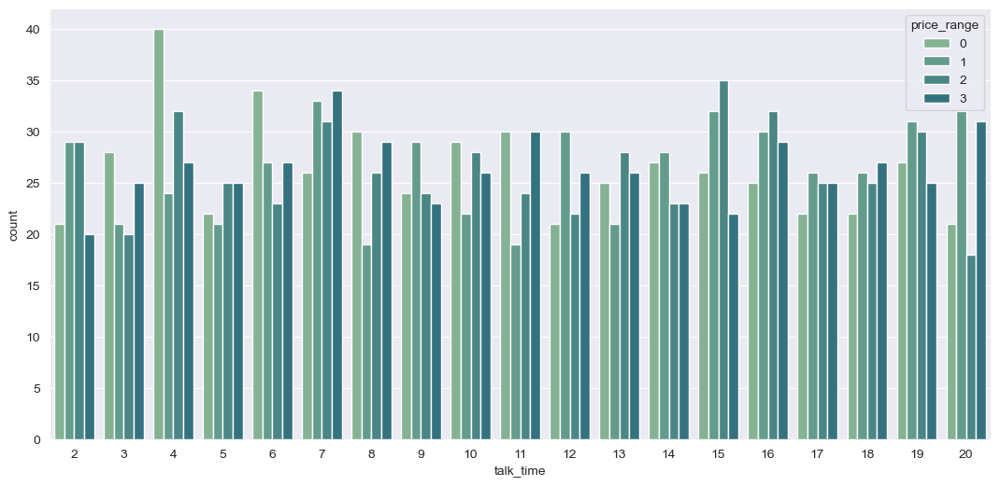

In [72]:
# talk_time based on price_range
plt.figure(figsize = (13,6))
sns.countplot(x = Df['talk_time'], hue ="price_range", data=Df) 
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
        <strong>Observations:</strong> 
    <br>
    
- The range of **talk_time** varies from **2 to 20**.
- Mobile phones with **talk_time 4** with a **Low-cost price range** have the highest count among all phones.

#### 🎄Ram (Megabytes):

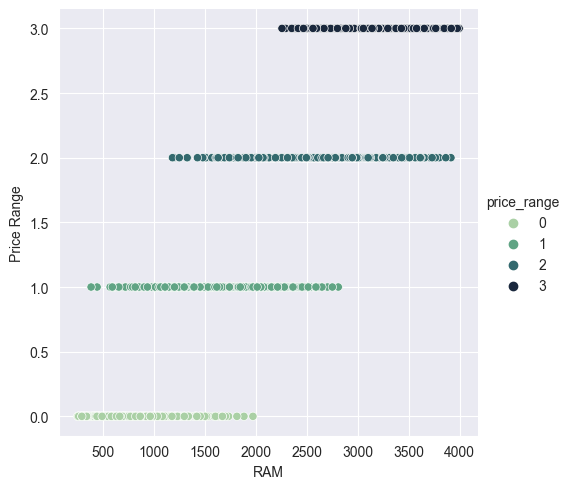

In [76]:
# Create scatter plot
sns.relplot(data=Df, x="ram", y="price_range", hue="price_range", palette="ch:r=-.5, l=.75")

# Add axis labels
plt.xlabel("RAM", fontsize=10)
plt.ylabel("Price Range", fontsize=10)

# Show the plot
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>
    
- By increasing the value of ram from **256-4000 megabytes**, the price range will increase.

#### 🎄Mean of 'Price range' per each unique value of different categorical features:

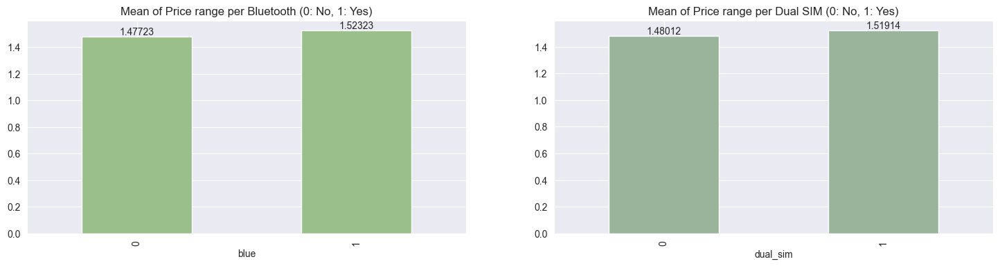

In [77]:
f,ax=plt.subplots(1,2,figsize=(18, 4))

ax1= Df[['price_range','blue']].groupby(['blue']).mean().plot.bar(color='#9bbf8a',ax=ax[0])
for container in ax1.containers:
    ax1.bar_label(container)
ax[0].set_title('Mean of Price range per Bluetooth (0: No, 1: Yes)')
ax1.legend().set_visible(False)

ax2= Df[['price_range','dual_sim']].groupby(['dual_sim']).mean().plot.bar(color='#99b49a',ax=ax[1])  
for container in ax2.containers:
    ax2.bar_label(container)
ax[1].set_title('Mean of Price range per Dual SIM (0: No, 1: Yes)')
ax2.legend().set_visible(False)

plt.show()

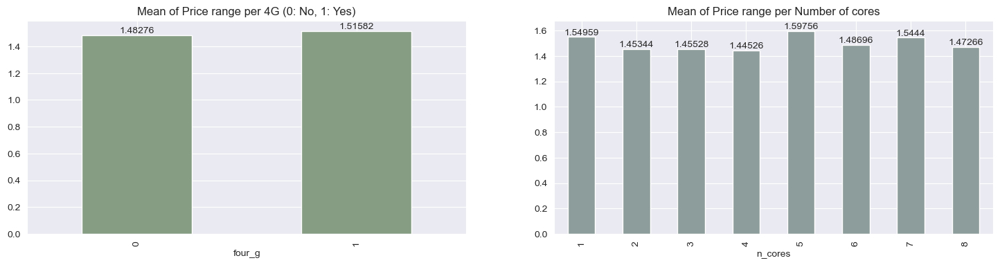

In [75]:
f,ax=plt.subplots(1,2,figsize=(18, 4))

ax1= Df[['price_range','four_g']].groupby(['four_g']).mean().plot.bar(color='#869d84',ax=ax[0])
for container in ax1.containers:
    ax1.bar_label(container)
ax[0].set_title('Mean of Price range per 4G (0: No, 1: Yes)')
ax1.legend().set_visible(False)

ax2= Df[['price_range','n_cores']].groupby(['n_cores']).mean().plot.bar(color='#8d9d9b',ax=ax[1])  
for container in ax2.containers:
    ax2.bar_label(container)
ax[1].set_title('Mean of Price range per Number of cores')
ax2.legend().set_visible(False)

plt.show()

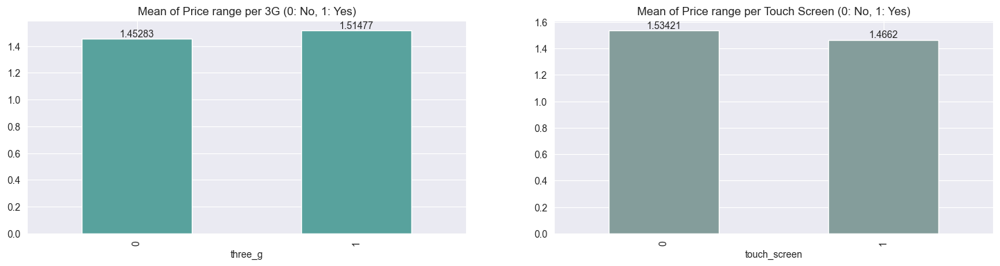

In [78]:
f,ax=plt.subplots(1,2,figsize=(18, 4))

ax1= Df[['price_range','three_g']].groupby(['three_g']).mean().plot.bar(color='#58a29d',ax=ax[0])
for container in ax1.containers:
    ax1.bar_label(container)
ax[0].set_title('Mean of Price range per 3G (0: No, 1: Yes)')
ax1.legend().set_visible(False)

ax2= Df[['price_range','touch_screen']].groupby(['touch_screen']).mean().plot.bar(color='#849d9b',ax=ax[1])  
for container in ax2.containers:
    ax2.bar_label(container)
ax[1].set_title('Mean of Price range per Touch Screen (0: No, 1: Yes)')
ax2.legend().set_visible(False)

plt.show()

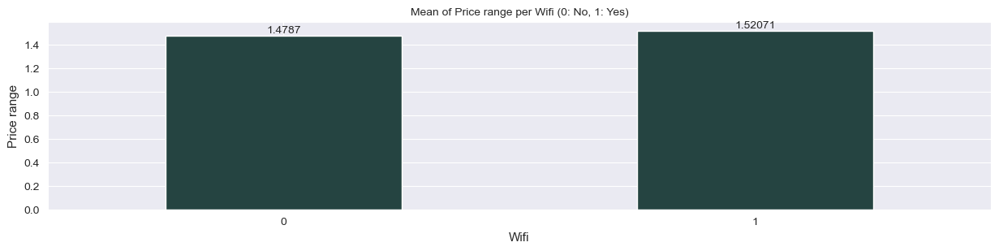

In [77]:
plt.figure(figsize = (15, 3))
a=Df.groupby('wifi')['price_range'].mean()
ax = a.plot.bar(color="#254441", width=.5)
for container in ax.containers:
    ax.bar_label(container)
plt.title('Mean of Price range per Wifi (0: No, 1: Yes)', size=10)
plt.ylabel('Price range', size=11)
plt.xlabel('Wifi', size=11)
plt.xticks(rotation=0)
plt.legend().set_visible(False)
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
  <strong>Observations:</strong> 
    <br>
    
- The Mean of Price range per Number of cores shows that mobile phones with **5 cores** have the highest mean of the price range.

In [79]:
# Describing the numerical variables
num_cols.describe().style.background_gradient(cmap='Greens')

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,1.522250,4.309500,32.046500,0.626000,140.249000,9.916500,646.529000,1251.515500,2124.213000,12.306500,6.199420,11.011000
std,439.418206,0.816004,4.341444,18.145715,0.165159,35.399655,6.064315,441.845917,432.199447,1084.732044,4.213245,3.891793,5.463955
min,501.000000,0.500000,0.000000,2.000000,0.500000,80.000000,0.000000,65.000000,500.000000,256.000000,5.000000,2.540000,2.000000
25%,851.750000,0.700000,1.000000,16.000000,0.500000,109.000000,5.000000,282.750000,874.750000,1207.500000,9.000000,2.540000,6.000000
50%,1226.000000,1.500000,3.000000,32.000000,0.500000,141.000000,10.000000,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000
75%,1615.250000,2.200000,7.000000,48.000000,0.800000,170.000000,15.000000,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000
max,1998.000000,3.000000,19.000000,64.000000,1.000000,200.000000,20.000000,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000


<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">5.5. Multivariate Analysis</p>

#### 🎄Internal memory - Ram:

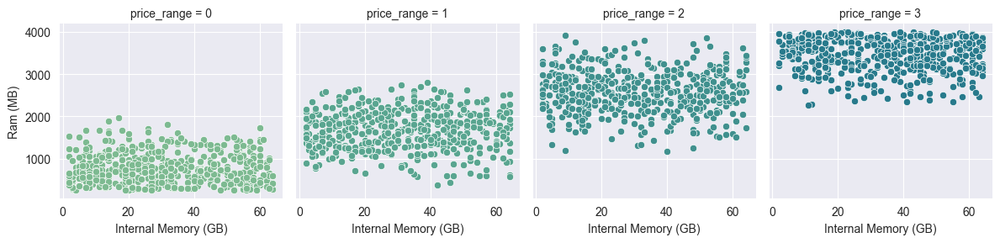

In [80]:
g = sns.FacetGrid(Df, col="price_range", hue="price_range")
g.map(sns.scatterplot, "int_memory", "ram")
g.set_axis_labels("Internal Memory (GB)", "Ram (MB)")
plt.show()

#### 🎄Ram - Battery power:

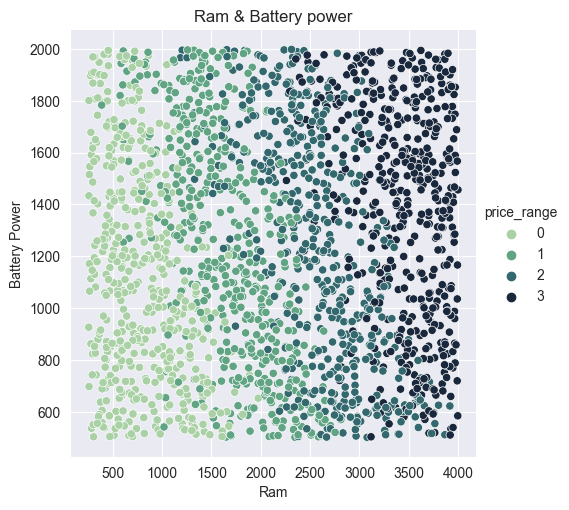

In [81]:
sns.relplot(data=Df, x="ram", y="battery_power", hue="price_range", palette="ch:r=-.5,l=.75")
plt.xlabel('Ram')
plt.ylabel('Battery Power')
plt.title('Ram & Battery power')
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
     <strong>Observations:</strong> 
    <br>
    
- Battery power does not necessarily improve by increasing the Ram of the mobile phones.

#### 🎄Display Resolution (Pixel Height x Pixel Width):

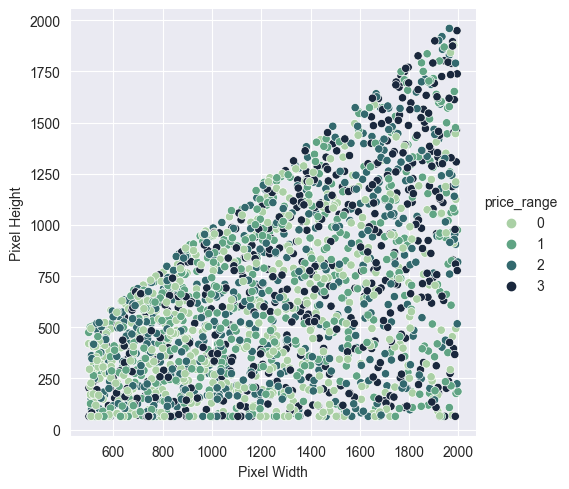

In [82]:
sns.relplot(data=Df, x="px_width", y="px_height", hue="price_range", palette="ch:r=-.5,l=.75")
plt.xlabel('Pixel Width')
plt.ylabel('Pixel Height')
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
   <strong>Observations:</strong> 
    <br>
    
- Generally, **Display Resolution** illustrates by increasing **Pixel Height**, the **Pixel Width** will increase. 

#### 🎄Screen Size (Screen Height x Screen Width):

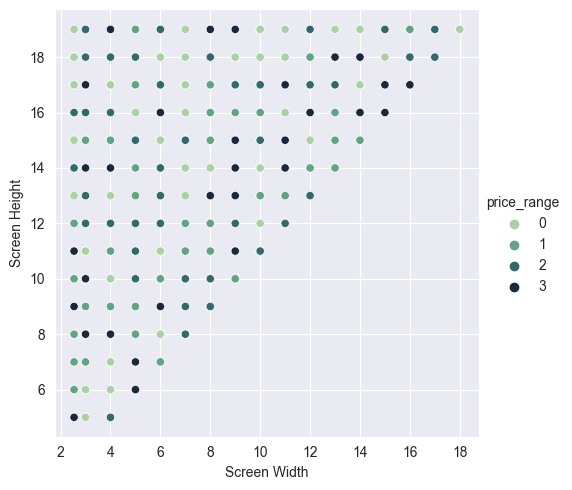

In [83]:
sns.relplot(data=Df, x="sc_w", y="sc_h", hue="price_range", palette="ch:r=-.5,l=.75")
plt.xlabel('Screen Width')
plt.ylabel('Screen Height')
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Observations:</strong> 
    <br>
    
- **Screen Size** illustrates by increasing **Screen Height**, the **Screen Width** will increase.

#### 🎄Bluetooth - Ram :

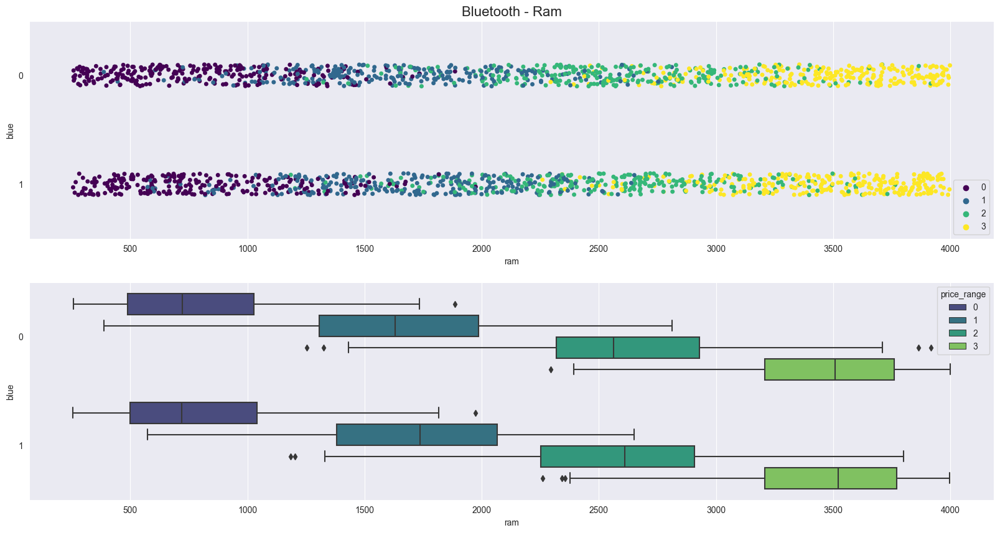

In [84]:
fig, axes = plt.subplots(2,1, figsize=(20,10))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='blue', orient='h', ax=axes[0])
axes[0].set_title('Bluetooth - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='blue', orient='h', ax=axes[1])
plt.show()

#### 🎄Dual Sim - Ram:

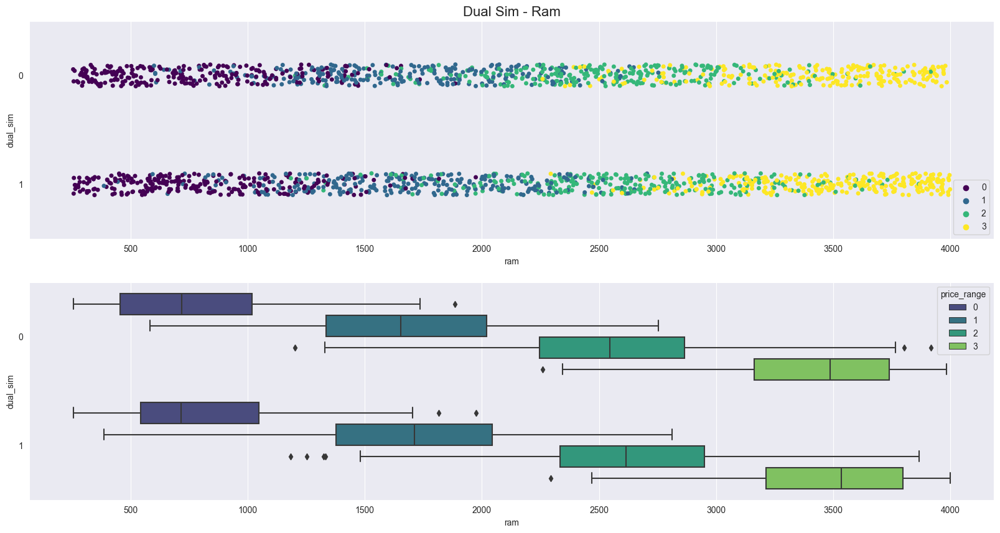

In [85]:
fig, axes = plt.subplots(2,1, figsize=(20,10))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='dual_sim', orient='h', ax=axes[0])
axes[0].set_title('Dual Sim - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='dual_sim', orient='h', ax=axes[1])
plt.show()

#### 🎄4G - Ram:

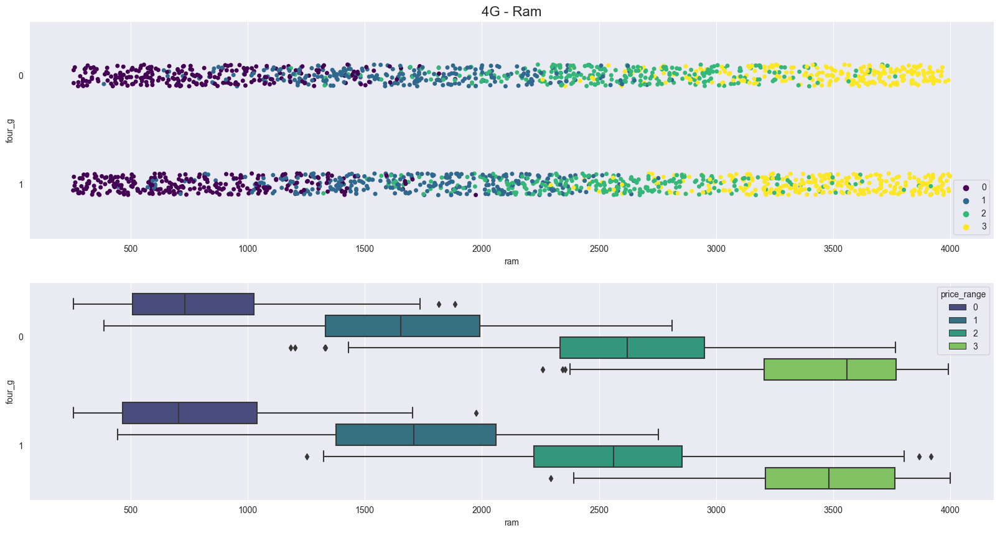

In [86]:
fig, axes = plt.subplots(2,1, figsize=(20,10))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='four_g', orient='h', ax=axes[0])
axes[0].set_title('4G - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='four_g', orient='h', ax=axes[1])
plt.show()

#### 🎄Number of Cores - Ram:

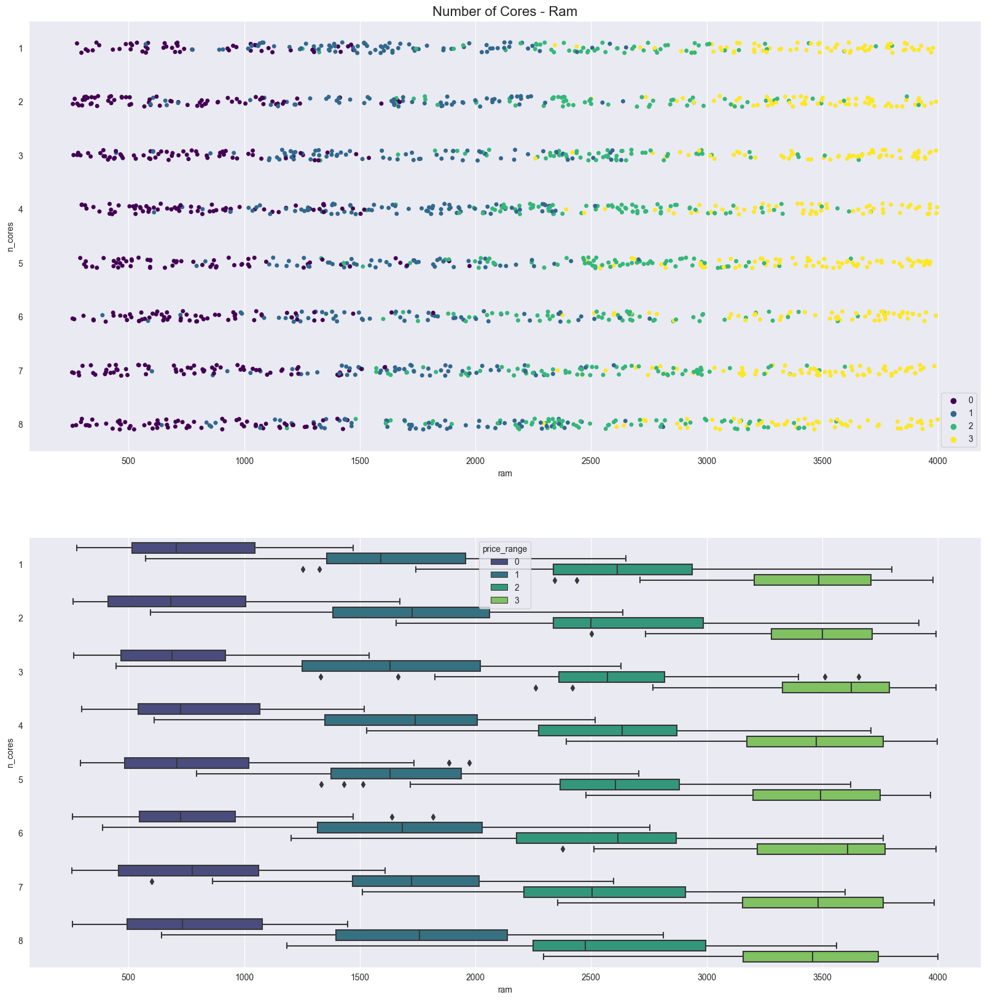

In [87]:
fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='n_cores', orient='h', ax=axes[0])
axes[0].set_title('Number of Cores - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='n_cores', orient='h', ax=axes[1])
plt.show()

#### 🎄3G - Ram:

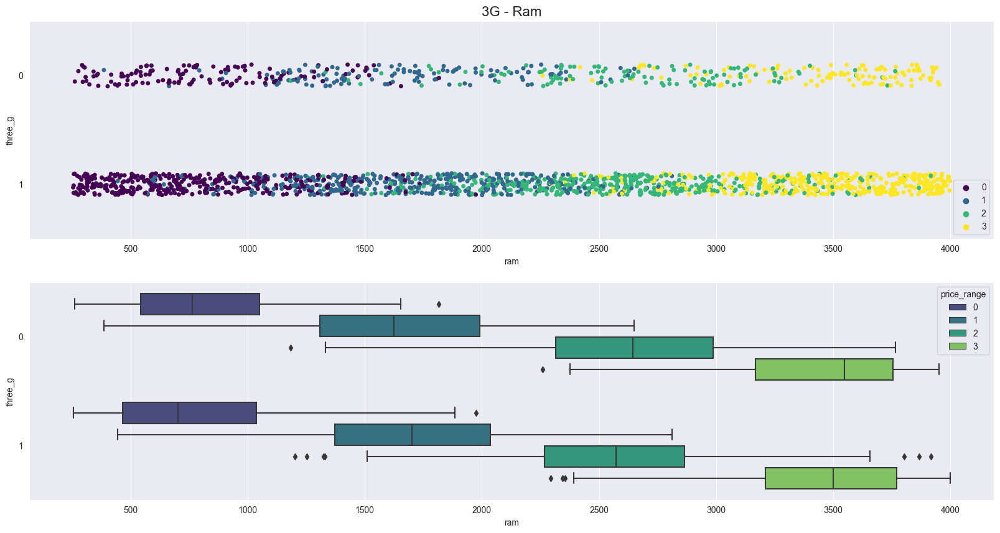

In [88]:
fig, axes = plt.subplots(2,1, figsize=(20,10))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='three_g', orient='h', ax=axes[0])
axes[0].set_title('3G - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='three_g', orient='h', ax=axes[1])
plt.show()

#### 🎄Touch Screen - Ram:

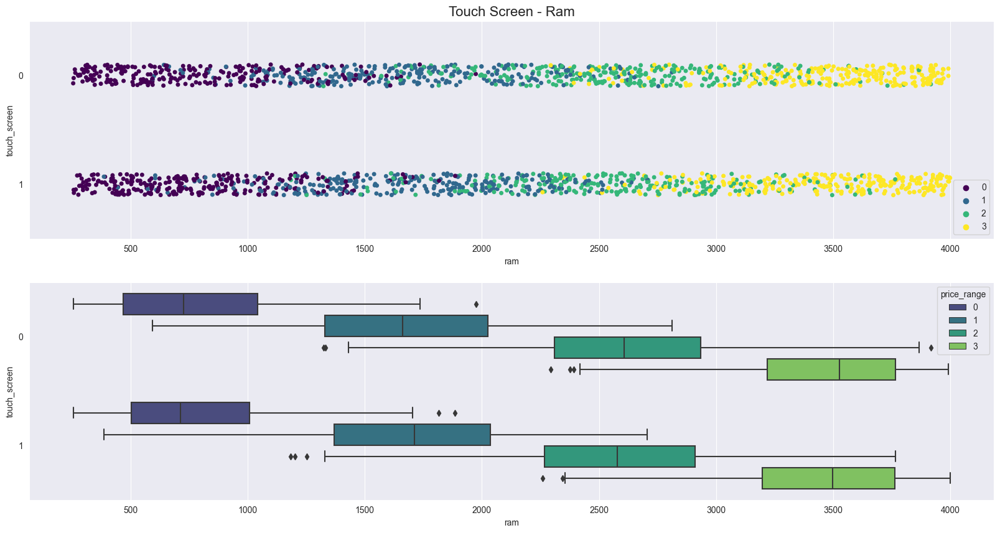

In [89]:
fig, axes = plt.subplots(2,1, figsize=(20,10))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='touch_screen', orient='h', ax=axes[0])
axes[0].set_title('Touch Screen - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='touch_screen', orient='h', ax=axes[1])
plt.show()

#### 🎄Wifi - Ram:

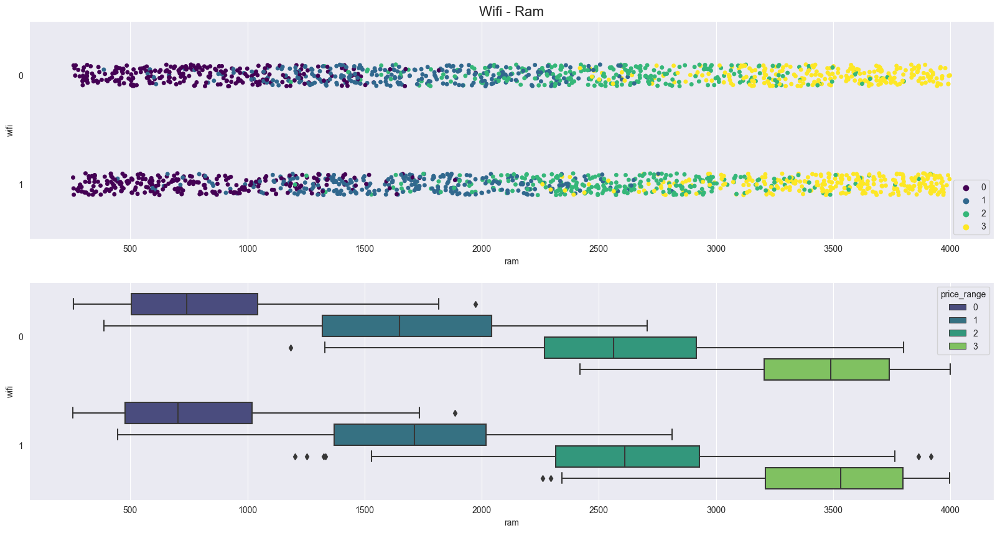

In [90]:
fig, axes = plt.subplots(2,1, figsize=(20,10))
sns.stripplot(data=Df, x='ram', palette='viridis', hue='price_range', y='wifi', orient='h', ax=axes[0])
axes[0].set_title('Wifi - Ram', fontsize='16')
axes[0].legend(loc=4)
sns.boxplot(data=Df, x='ram', palette='viridis', hue='price_range', y='wifi', orient='h', ax=axes[1])
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
 <strong>Observations:</strong> 
    <br>
    
- Overall, we observe that increasing the **RAM** in mobile phones leads to an increase in **price range** across all categorical features.

<a id="1"></a>  
#### <p style="padding:5px;background-color:#d5eae9;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 50px 50px;overflow:hidden;font-weight:200">5.6. Correlation</p>

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">

Our **target** is **Price Range**. So, we should check how each attribute correlates with the Price Range variable. We can do it as follows:

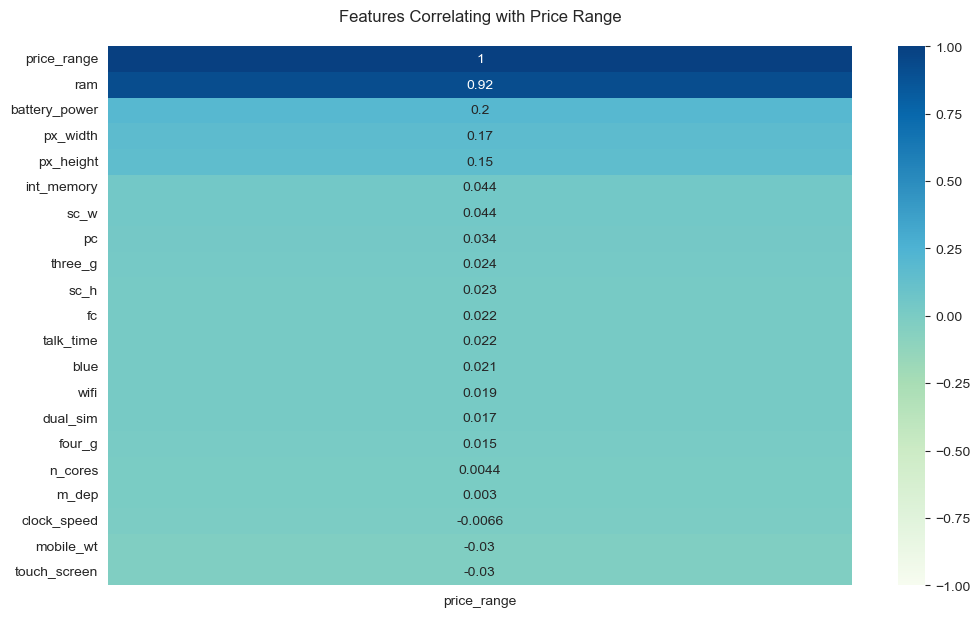

In [90]:
plt.figure (figsize = (12, 7), dpi = 100)
heatmap = sns.heatmap (Df.corr()[['price_range']].sort_values (by = 'price_range', ascending = False), vmin = -1, vmax = 1, annot = True, cmap = 'GnBu')
heatmap.set_title ('Features Correlating with Price Range', fontdict = {'fontsize':12}, pad = 18);

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
    <strong>Interpretation:</strong> 
    <br>

- The correlation coefficient ranges from **-1 to +1**.
- When it is close to +1, this signifies that there is a strong **positive correlation**. 
- So, we can see that there is a **positive correlation** between **Price Range** and **ram**, **Price Range** and **battery_power**, and **Price Range** and **px_width**.
- When it is close to -1, it means that there is a strong **negative correlation**. When it is close to 0, it means that there is **no correlation**.
- We can see that most of the variables except **clock_speed, mobile_wt** and **touch_screen** are positively correlated with the **target**.

### 🟢Correlation Between The Features

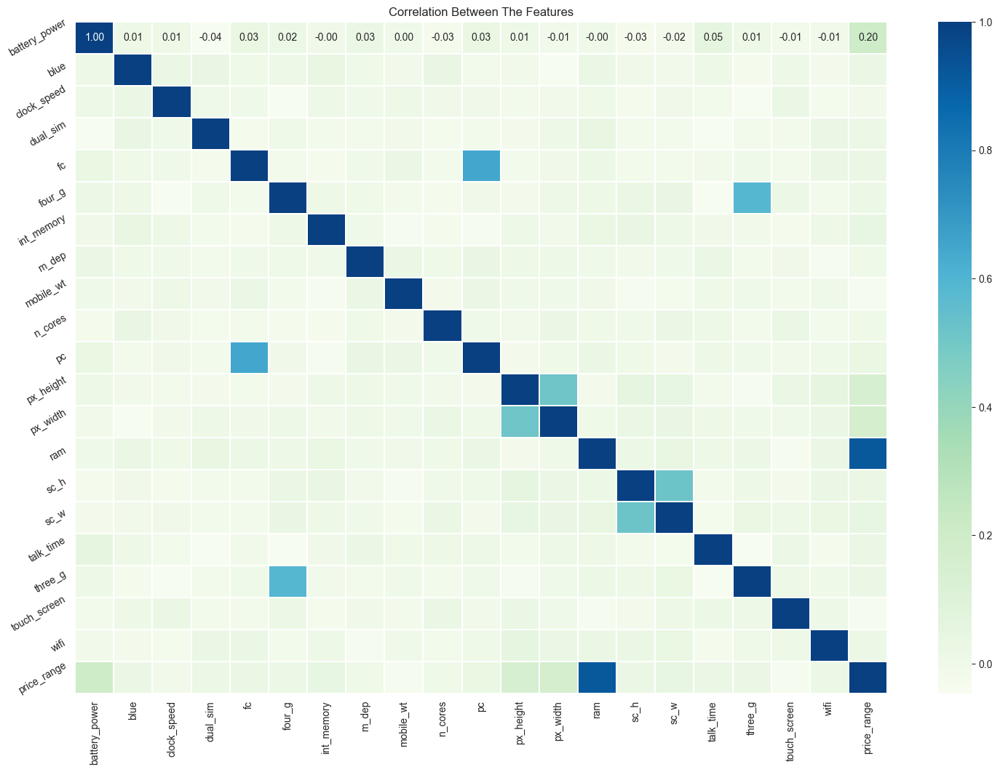

In [91]:
fig=plt.gcf()
fig.set_size_inches(18, 12)
plt.title('Correlation Between The Features')
a = sns.heatmap(Df.corr(), annot = True, cmap = 'GnBu', fmt='.2f', linewidths=0.2)
a.set_xticklabels(a.get_xticklabels(), rotation=90)
a.set_yticklabels(a.get_yticklabels(), rotation=30)
plt.show()

<div style="background-color:black; padding:20px; font-size:15px ; text-color:white">
       <strong>Interpretation:</strong> 
    <br>
    
- There is a **strong** correlation between **ram** and **price_range**.
- In addition, the heatmap above indicates a **moderate** correlation between **4G** and **3G**, **fc** and **pc**, **px_height** and **px_width**, and **sc_h** and **sc_w**. 